# Relationship Between Vancouver's Crime, Time, and Neighborhood

Group 22: Seerat Ghai, Joey Su & Jade Chen

![vancouver Neighborhood Map](https://www.theunconventionalroute.com/wp-content/uploads/2018/10/correct-vancouver-neighborhood-map.png)
<br>Source: [Faith Wilson Group](https://faithwilson.com/vancouver-neighbourhoods/)

## Introduction

It appears to be a common perception that criminal activity happens after sunset. Parents advise children to avoid staying out late and media depicts certain neighborhoods to have higher rates of illegal activities. Why do crimes occur both when they do and where they are? According to one study<sup>1</sup>, there appears to be correlation between the time of day and both crime rate and severity of crimes. Using data from Vancouver Police Department, we set out to analyze crime data for 2022 across 6 neighborhoods in Vancouver to answer the following question:

<span style="color:blue">Is there a relationship between time and average severity of crime across 6 neighborhoods in Vancouver?</span>


In our study, we will define <span style="color:blue">severity of crime rates as our random variable</span>, the <span style="color:blue">mean as our location parameter</span>, and the <span style="color:blue">standard deviation as the scale parameter</span>. We choose the mean as the location parameter because the mean varies less than other measures of central tendency, and the standard deviation because like the mean, the standard deviation is stable with regard to sampling fluctuations. In addition, we use the level of standard deviation to assess whether there is a meaningful relationship (e.g. a low standard deviation would suggest that there is a stronger relationship to specific time of day). We will also check our data for any atypical extreme scores which could lead to misleading results.

Fear of crime can be a barrier to utilizing public spaces. One study<sup>2</sup> suggests that park ratings were lower for parks with high violent crime rates, which in turn has lead to fewer park visits. Another study<sup>3</sup> shows that criminal offenders appear to have temporal crime pattern. We hope that our findings can provide a rough framework of “safe” times and zones, prove to be valuable for improving crime analysis, as well as facilitate policies to reduce recidivism rates.## Preliminary Results

## Methods and Results

1. Extract data from [Vancouver Police Department Crime Data](https://geodash.vpd.ca/opendata/). 
2. Categorize time periods.
3. Define severity of crimes.
4. Use the mean as a location parameter to calculate the central tendency.
5. Calculate standard deviation as a scale parameter to check if there are any outliers or significant variability in the data
6. Create a hypothesis and then test it.
7. Conduct a two-sample t-test to compare the mean severity of crimes during different periods of the day.
8. Set the significance level at 0.05 to determine if observed differences in means are statistically significant.
9. Calculate a 95% confidence interval for the mean severity of crimes during each period of the day using bootstrap and asymptotic methods.
10. Compare results of bootstrap and asymptotic methods.
11. Reflect on findings and discuss potential implications of a significant relationship between time of day and crime severity in Vancouver.


### Preliminary exploratory data analysis

#### Loading R libraries

In [1]:
library(tidyverse)
library(broom)
library(repr)
library(digest)
library(infer)
library('dplyr')
library(dplyr)
library(gridExtra)
library(RColorBrewer)
library(cowplot)
library(datateachr)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6      ✔ purrr   0.3.4 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.4.1 
✔ readr   2.1.2      ✔ forcats 0.5.2 
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




#### Reading Data

In [19]:
url <- "https://raw.githubusercontent.com/SG0707/STAT-201-Group-project-/main/crimedata_csv_AllNeighbourhoods_2022.csv"
crime_data <- read_csv(url)

Rows: 34189 Columns: 10
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): TYPE, HUNDRED_BLOCK, NEIGHBOURHOOD
dbl (7): YEAR, MONTH, DAY, HOUR, MINUTE, X, Y

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


#### Categorize Time Periods
Add a time period variable (`time_period`) based on the hour of the day (using `HOUR`).

In [20]:
set.seed(5)
crime_data <- crime_data %>%
  mutate(time_period = case_when(
    HOUR >= 0 & HOUR < 6 ~ "Night",
    HOUR >= 6 & HOUR < 12 ~ "Morning",
    HOUR >= 12 & HOUR < 18 ~ "Afternoon",
    HOUR >= 18 & HOUR <= 23 ~ "Evening"
  ))

head(crime_data)

TYPE,YEAR,MONTH,DAY,HOUR,MINUTE,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,time_period
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>
Theft from Vehicle,2022,7,31,21,0,19XX W 10TH AVE,Kitsilano,489173.7,5456686,Evening
Theft from Vehicle,2022,8,16,0,0,19XX W 11TH AVE,Kitsilano,489154.2,5456574,Night
Theft from Vehicle,2022,4,17,0,0,19XX W 13TH AVE,Kitsilano,489108.9,5456375,Night
Theft from Vehicle,2022,1,4,23,30,19XX W 14TH AVE,Kitsilano,489201.6,5456265,Evening
Theft from Vehicle,2022,9,15,23,0,19XX W 15TH AVE,Kitsilano,489199.6,5456157,Evening
Theft from Vehicle,2022,7,6,15,0,19XX W 1ST AVE,Kitsilano,489216.8,5457556,Afternoon


As seen above, a new variable `time_period` was added to the dataset.

#### Remove variables
Remove variables not used in data analysis(`MONTH` `DAY` `HOUR` `MINUTE`).

In [21]:
crime_data <- crime_data %>%
    select(
        - "MONTH",
        - "DAY",
        - "HOUR",
        - "MINUTE"
    )
head(crime_data)

TYPE,YEAR,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,time_period
<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>
Theft from Vehicle,2022,19XX W 10TH AVE,Kitsilano,489173.7,5456686,Evening
Theft from Vehicle,2022,19XX W 11TH AVE,Kitsilano,489154.2,5456574,Night
Theft from Vehicle,2022,19XX W 13TH AVE,Kitsilano,489108.9,5456375,Night
Theft from Vehicle,2022,19XX W 14TH AVE,Kitsilano,489201.6,5456265,Evening
Theft from Vehicle,2022,19XX W 15TH AVE,Kitsilano,489199.6,5456157,Evening
Theft from Vehicle,2022,19XX W 1ST AVE,Kitsilano,489216.8,5457556,Afternoon


#### Define severity of crimes

Create a new (categorical variable) variable for crime severity
- 1: Mischief and Theft
- 2: Break and Enter
- 3: Offense against a Person, Vehicle Collision or Pedestrian Struck (with Injury), Homicide, Vehicle Collision or Pedestrian Struck (with Fatality)

In [22]:
set.seed(5)

for(i in 1:length(crime_data$TYPE)){
  if(crime_data$TYPE[i] %in% c("Mischief", "Other Theft", "Theft from Vehicle", "Theft of Bicycle", "Theft of Vehicle")) {crime_data$TYPE[i] = 1}
  if(crime_data$TYPE[i] %in% c("Break and Enter Commercial", "Break and Enter Residential/Other")) {crime_data$TYPE[i] = 2}
  if(crime_data$TYPE[i] %in% c("Offence Against a Person", "Vehicle Collision or Pedestrian Struck (with Injury)","Homicide", 
                         "Vehicle Collision or Pedestrian Struck (with Fatality)")) {crime_data$TYPE[i] = 3}
}

head(crime_data)

TYPE,YEAR,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,time_period
<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>
1,2022,19XX W 10TH AVE,Kitsilano,489173.7,5456686,Evening
1,2022,19XX W 11TH AVE,Kitsilano,489154.2,5456574,Night
1,2022,19XX W 13TH AVE,Kitsilano,489108.9,5456375,Night
1,2022,19XX W 14TH AVE,Kitsilano,489201.6,5456265,Evening
1,2022,19XX W 15TH AVE,Kitsilano,489199.6,5456157,Evening
1,2022,19XX W 1ST AVE,Kitsilano,489216.8,5457556,Afternoon


#### Convert Severity to Numeric

In [23]:
crime_data <- crime_data %>% 
        rename(severity = TYPE)

crime_data$severity = as.numeric(as.character(crime_data$severity))

head(crime_data) 

severity,YEAR,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,time_period
<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>
1,2022,19XX W 10TH AVE,Kitsilano,489173.7,5456686,Evening
1,2022,19XX W 11TH AVE,Kitsilano,489154.2,5456574,Night
1,2022,19XX W 13TH AVE,Kitsilano,489108.9,5456375,Night
1,2022,19XX W 14TH AVE,Kitsilano,489201.6,5456265,Evening
1,2022,19XX W 15TH AVE,Kitsilano,489199.6,5456157,Evening
1,2022,19XX W 1ST AVE,Kitsilano,489216.8,5457556,Afternoon


#### Filter Missing Values

In [6]:
set.seed(15)

# Filter out rows with missing values in NEIGHBOURHOOD column
crime_data <- crime_data %>%
  select(severity, time_period, NEIGHBOURHOOD) %>%

  filter(!is.na(NEIGHBOURHOOD))

head(crime_data) 

severity,time_period,NEIGHBOURHOOD
<dbl>,<chr>,<chr>
1,Evening,Kitsilano
1,Night,Kitsilano
1,Night,Kitsilano
1,Evening,Kitsilano
1,Evening,Kitsilano
1,Afternoon,Kitsilano


#### Plotting Relationship Between Severity and Hours of Crimes 

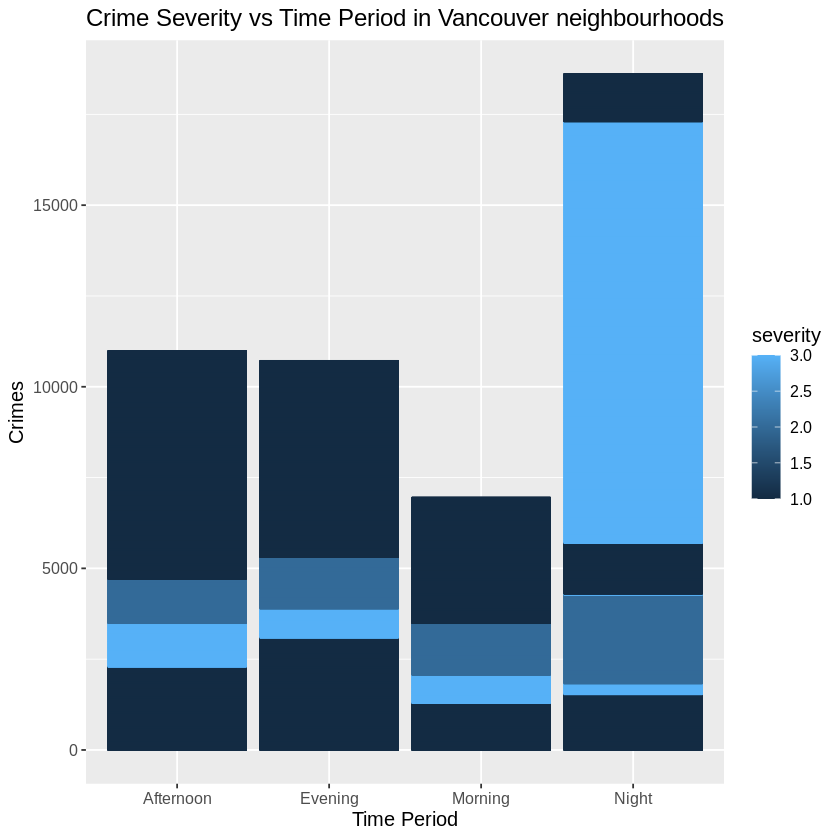

In [7]:
data_pop_dist <- ggplot(crime_data, aes( x = time_period, 
                                        y = severity, 
                                       color = severity)) +
  geom_bar(stat = "identity") +
  labs(x = "Time Period", y = "Crimes", fill = "severity") +
  ggtitle("Crime Severity vs Time Period in Vancouver neighbourhoods") + 
  theme(text = element_text(size = 12))

data_pop_dist

In [8]:
set.seed(225)

# Calculate the mean severity of crimes for each time period
pop_mean_severity <- crime_data %>%
  group_by(time_period) %>%
  summarize(mean_severity = mean(severity, na.rm = TRUE))

pop_mean_severity

time_period,mean_severity
<chr>,<dbl>
Afternoon,1.147409
Evening,1.131376
Morning,1.215360
Night,1.973908


In [9]:
set.seed(335)

# Calculate the standard deviation of crime severity for each time period
pop_sd_severity <- crime_data %>%
  group_by(time_period) %>%
  summarize(sd_severity = sd(severity, na.rm = TRUE))

pop_sd_severity 

time_period,sd_severity
<chr>,<dbl>
Afternoon,0.4574698
Evening,0.4132072
Morning,0.5099005
Night,0.9327431


In [10]:
crime_data %>%
group_by(severity, time_period) %>% 
  tally()

severity,time_period,n
<dbl>,<chr>,<int>
1,Afternoon,8561
1,Evening,8493
1,Morning,4745
1,Night,4227
2,Afternoon,611
2,Evening,708
2,Morning,711
2,Night,1220
3,Afternoon,400


In [12]:

crime_data[crime_data=="Night"] <- "PM"
crime_data[crime_data=="Evening"] <- "PM"
crime_data[crime_data=="Afternoon"] <- "AM"
crime_data[crime_data=="Morning"] <- "AM"
head(crime_data)

severity,time_period,NEIGHBOURHOOD
<dbl>,<chr>,<chr>
1,PM,Kitsilano
1,PM,Kitsilano
1,PM,Kitsilano
1,PM,Kitsilano
1,PM,Kitsilano
1,AM,Kitsilano


In [13]:
set.seed(0) 

null_distribution <- crime_data %>% 
  specify(formula = severity ~ time_period) %>% 
  hypothesize(null = "independence") %>% 
  generate(reps = 100, type = "permute") %>% 
  calculate(stat = "diff in means", order = c("PM", "AM"))

head(null_distribution)

replicate,stat
<int>,<dbl>
1,0.0008506101
2,-0.0044742053
3,0.0022705609
4,-0.0128755808
5,-0.0170171040
6,0.0137484965


stat
<dbl>
0.3789125


Warning message:
“Please be cautious in reporting a p-value of 0. This result is an approximation based on the number of `reps` chosen in the `generate()` step. See `?get_p_value()` for more information.”


p_value
<dbl>
0


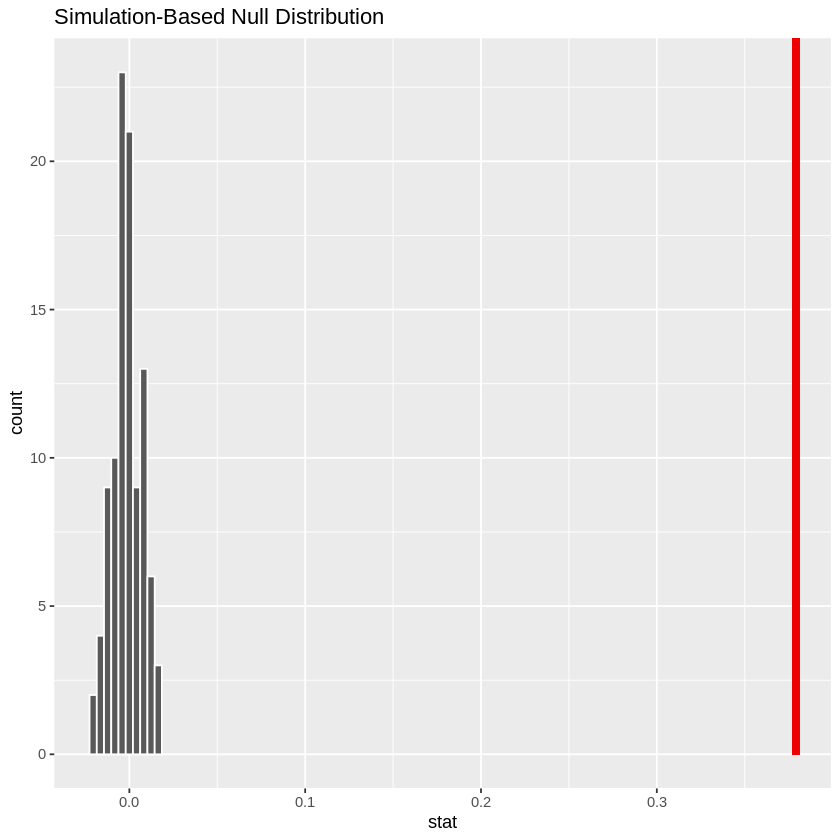

In [14]:
obs_diff <- crime_data %>% 
  specify(formula = severity ~ time_period) %>% 
  calculate(stat = "diff in means", order = c("PM", "AM"))
obs_diff
null_distribution_dist <- null_distribution %>%
    visualize(bins = 10) +
    shade_p_value(obs_stat = obs_diff, direction = "right")

null_distribution_dist
p_val <- null_distribution %>% 
  get_p_value(obs_stat = obs_diff, direction = "right")
p_val

lower_ci,upper_ci
<dbl>,<dbl>
0.3659105,0.389012


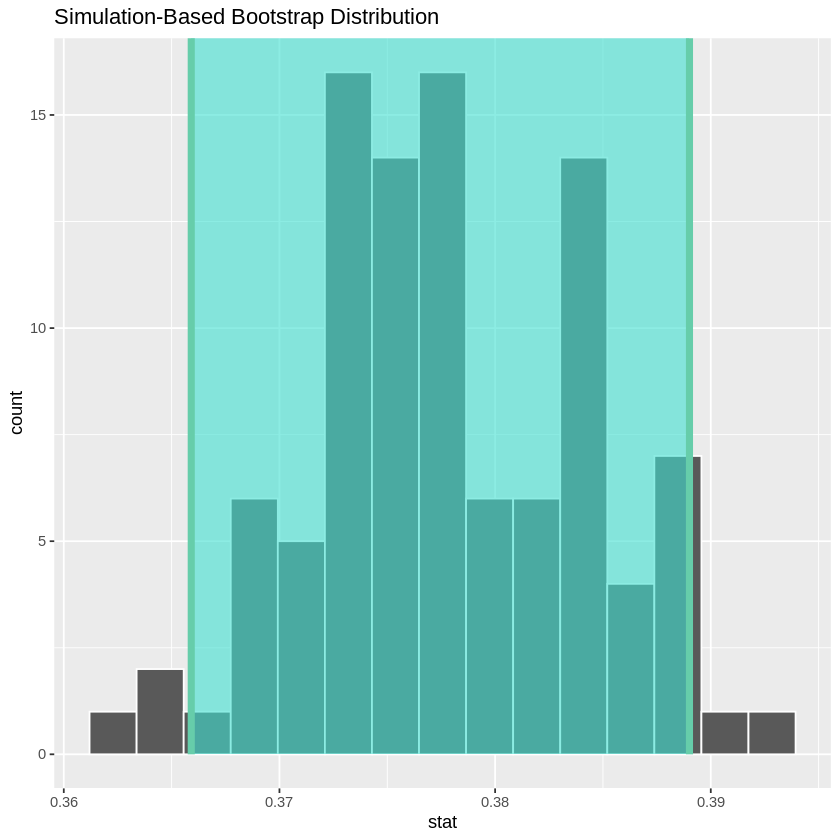

In [15]:

bootstrap_distribution <- crime_data %>% 
  specify(formula = severity ~ time_period) %>% 
  generate(reps = 100, type = "bootstrap") %>% 
  calculate(stat = "diff in means", order = c("PM", "AM"))
percentile_ci <- bootstrap_distribution %>% 
  get_confidence_interval(level = 0.95, type = "percentile")
percentile_ci
visualize(bootstrap_distribution) + 
  shade_confidence_interval(endpoints = percentile_ci)

### Hypothesis: The severity of crimes in Vancouver is higher during the evening and night time periods compared to the morning and afternoon time periods.

## Hypothesis 

* Ho: μ1 - μ2 = 0

* Ha: μ1 - μ2 > 0

Ho (Null Hypothesis): There is no significant difference in the severity of crimes between evening/night time periods and morning/afternoon time periods in Vancouver.

Ha (Alternative Hypothesis): The severity of crimes in Vancouver is higher during the evening and night time periods compared to the morning and afternoon time periods.

In [ ]:
# Subset the data for evening/night time periods
PM_data <- crime_data %>%
  filter(time_period == "PM")

head(PM_data)

In [ ]:
# Subset the data for morning/afternoon time periods
AM_data <- crime_data %>%
  filter(time_period == "AM")

head(AM_data)

In [ ]:
# Perform independent t-test
t_test_result <- t.test(PM_data$severity, AM_data$severity, 
                        alternative = "two.sided", var.equal = FALSE)
t_test_result

In [ ]:
# Extract the t-value, p-value, and confidence interval
t_value <- t_test_result$statistic
p_value <- t_test_result$p.value
conf_interval <- t_test_result$conf.int

cat("t-value:", t_value, "\n")
cat("p-value:", p_value, "\n")
cat("Confidence interval:", conf_interval[1], conf_interval[2], "\n")

## Discussion

In the discussion section you can just be like how our p value is 0, how 0 doesn't fall within our endpoints and our t test value is high so we are very confident that the difference exists

## References
1. [When Does Crime Occur Most: An In-depth Guide](https://www.vivint.com/resources/article/when-does-crime-occur-most) (non-scientific) 
2. [Effects of Crime Type and Location on Park Use Behavior](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7417020/) (scientific) 
3. [When Do Offenders Commit Crime? An Analysis of Temporal Consistency in Individual Offending Patterns](https://link.springer.com/article/10.1007/s10940-020-09470-w) (scientific) 